In [1]:
%matplotlib inline
import librosa

import matplotlib.pyplot as plt
import librosa.display
import os
import glob
import numpy as np
import sklearn
import pandas as pd

In [2]:
path = "source/"



In [3]:
files = [f for f in glob.glob(path + "**/*.*", recursive=True)]

In [4]:
audio_path = files[0]
sample, sample_rate = librosa.load(audio_path, sr = None)

In [7]:
import IPython.display as ipd
ipd.Audio(audio_path)

In [5]:
second_to_split_into = 30
samples_per_split = np.round(sample_rate * second_to_split_into)
array_to_split = np.arange(samples_per_split, sample.shape[0], samples_per_split)

In [6]:
split_arrays = np.split(sample, array_to_split)

In [7]:
split_arrays

[array([-1.5258789e-05,  0.0000000e+00,  0.0000000e+00, ...,
        -9.2329407e-01, -8.7445068e-01, -8.6051941e-01], dtype=float32),
 array([-0.87416077, -0.8103485 , -0.71754456, ..., -0.8236389 ,
        -0.8796387 , -0.9498596 ], dtype=float32),
 array([-0.95861816, -0.9824219 , -0.99090576, ..., -0.5631256 ,
        -0.53674316, -0.560791  ], dtype=float32),
 array([-0.6116638 , -0.609848  , -0.62654114, ..., -0.886261  ,
        -0.91023254, -0.9441223 ], dtype=float32),
 array([-0.9404144 , -0.90335083, -0.832901  , ..., -0.9623871 ,
        -0.97288513, -0.985199  ], dtype=float32),
 array([-0.94898987, -0.8868866 , -0.68162537, ..., -0.73513794,
        -0.820755  , -0.8731537 ], dtype=float32),
 array([-0.9232025 , -0.92497253, -0.89967346, ..., -0.682251  ,
        -0.6083832 , -0.56741333], dtype=float32),
 array([-0.5407257 , -0.61491394, -0.7317352 , ...,  0.08035278,
         0.0897522 ,  0.08990479], dtype=float32),
 array([ 0.08525085,  0.08345032,  0.08694458, ..., -0

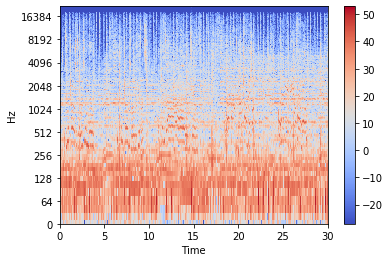

In [50]:
X = librosa.stft(split_arrays[1])
Xdb = librosa.amplitude_to_db(abs(X))
librosa.display.specshow(Xdb, sr=sample_rate, x_axis='time', y_axis='log')
plt.colorbar()

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(14, 5))

librosa.display.waveplot(x, sr=sr)

In [6]:
zero_crossings = librosa.zero_crossings(sample, pad=False)
sum(zero_crossings)

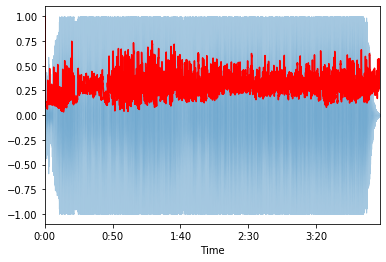

In [18]:
spectral_centroids = librosa.feature.spectral_centroid(sample, sr=sample_rate)[0]
spectral_centroids.shape
(775,)# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)# Normalising the spectral centroid for visualisation
def normalize(sample, axis=0):
    return sklearn.preprocessing.minmax_scale(sample, axis=axis)#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(sample, sr=sample_rate, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

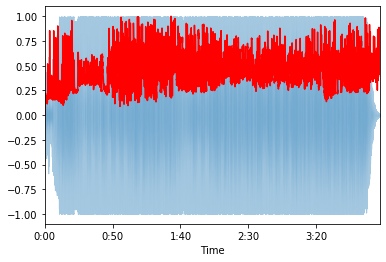

In [20]:
spectral_rolloff = librosa.feature.spectral_rolloff(sample+0.01, sr=sample_rate)[0]
librosa.display.waveplot(sample, sr=sample_rate, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

/home/echo/anaconda3/envs/song_classification/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/echo/anaconda3/envs/song_classification/lib/python3.7/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


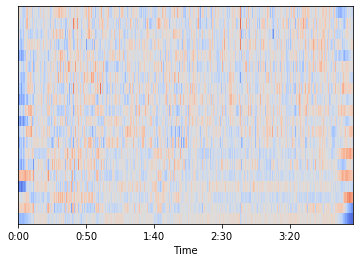

In [23]:
mfccs = librosa.feature.mfcc(sample, sr=sample_rate)
librosa.display.specshow(mfccs, sr=sample_rate, x_axis='time')


mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
librosa.display.specshow(mfccs, sr=sample_rate, x_axis='time')
